## Diabetes Risk Predictor Code 

In [1]:
#Importing relevant libraries 

import pandas as pd
import numpy as np

#data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotnine as p9
import missingno as msno

#correlation
from dython.nominal import associations
from dython.nominal import identify_nominal_columns

#ignore warnings
import warnings


#modelling 

import math
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import KFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score,accuracy_score

### SummaryStatistics and Exploratory Data Analysis

In [2]:
dataset = pd.read_csv('./Dataset2BRFSS2015.csv')

In [3]:
dataset_copy = dataset.copy(deep=True)

In [4]:
#creating a copy of the dataset with categories 

dataset_copy.Diabetes_binary[dataset_copy['Diabetes_binary'] == 0] = 'No Diabetes'
dataset_copy.Diabetes_binary[dataset_copy['Diabetes_binary'] == 1] = 'Diabetes'

dataset_copy.HighBP[dataset_copy['HighBP'] == 0] = 'No High BP'
dataset_copy.HighBP[dataset_copy['HighBP'] == 1] = 'High BP'

dataset_copy.HighChol[dataset_copy['HighChol'] == 0] = 'No High Cholesterol'
dataset_copy.HighChol[dataset_copy['HighChol'] == 1] = 'High Cholesterol'

dataset_copy.CholCheck[dataset_copy['CholCheck'] == 0] = 'No Cholesterol Check in 5 Years'
dataset_copy.CholCheck[dataset_copy['CholCheck'] == 1] = 'Cholesterol Check in 5 Years'

dataset_copy.Smoker[dataset_copy['Smoker'] == 0] = 'No'
dataset_copy.Smoker[dataset_copy['Smoker'] == 1] = 'Yes'

dataset_copy.Stroke[dataset_copy['Stroke'] == 0] = 'No'
dataset_copy.Stroke[dataset_copy['Stroke'] == 1] = 'Yes'

dataset_copy.HeartDiseaseorAttack[dataset_copy['HeartDiseaseorAttack'] == 0] = 'No'
dataset_copy.HeartDiseaseorAttack[dataset_copy['HeartDiseaseorAttack'] == 1] = 'Yes'

dataset_copy.PhysActivity[dataset_copy['PhysActivity'] == 0] = 'No'
dataset_copy.PhysActivity[dataset_copy['PhysActivity'] == 1] = 'Yes'

dataset_copy.Fruits[dataset_copy['Fruits'] == 0] = 'No'
dataset_copy.Fruits[dataset_copy['Fruits'] == 1] = 'Yes'

dataset_copy.Veggies[dataset_copy['Veggies'] == 0] = 'No'
dataset_copy.Veggies[dataset_copy['Veggies'] == 1] = 'Yes'

dataset_copy.HvyAlcoholConsump[dataset_copy['HvyAlcoholConsump'] == 0] = 'No'
dataset_copy.HvyAlcoholConsump[dataset_copy['HvyAlcoholConsump'] == 1] = 'Yes'

dataset_copy.AnyHealthcare[dataset_copy['AnyHealthcare'] == 0] = 'No'
dataset_copy.AnyHealthcare[dataset_copy['AnyHealthcare'] == 1] = 'Yes'

dataset_copy.NoDocbcCost[dataset_copy['NoDocbcCost'] == 0] = 'No'
dataset_copy.NoDocbcCost[dataset_copy['NoDocbcCost'] == 1] = 'Yes'

dataset_copy.GenHlth[dataset_copy['GenHlth'] == 1] = 'Excellent'
dataset_copy.GenHlth[dataset_copy['GenHlth'] == 2] = 'Very Good'
dataset_copy.GenHlth[dataset_copy['GenHlth'] == 3] = 'Good'
dataset_copy.GenHlth[dataset_copy['GenHlth'] == 4] = 'Fair'
dataset_copy.GenHlth[dataset_copy['GenHlth'] == 5] = 'Poor'

dataset_copy.DiffWalk[dataset_copy['DiffWalk'] == 0] = 'No'
dataset_copy.DiffWalk[dataset_copy['DiffWalk'] == 1] = 'Yes'

dataset_copy.Sex[dataset_copy['Sex'] == 0] = 'Female'
dataset_copy.Sex[dataset_copy['Sex'] == 1] = 'Male'

dataset_copy.Age[dataset_copy['Age'] == 1] = '18 to 24'
dataset_copy.Age[dataset_copy['Age'] == 2] = '25 to 29'
dataset_copy.Age[dataset_copy['Age'] == 3] = '30 to 34'
dataset_copy.Age[dataset_copy['Age'] == 4] = '35 to 39'
dataset_copy.Age[dataset_copy['Age'] == 5] = '40 to 44'
dataset_copy.Age[dataset_copy['Age'] == 6] = '45 to 49'
dataset_copy.Age[dataset_copy['Age'] == 7] = '50 to 54'
dataset_copy.Age[dataset_copy['Age'] == 8] = '55 to 59'
dataset_copy.Age[dataset_copy['Age'] == 9] = '60 to 64'
dataset_copy.Age[dataset_copy['Age'] == 10] = '65 to 69'
dataset_copy.Age[dataset_copy['Age'] == 11] = '70 to 74'
dataset_copy.Age[dataset_copy['Age'] == 12] = '75 to 79'
dataset_copy.Age[dataset_copy['Age'] == 13] = '80 or older'

dataset_copy.Education[dataset_copy['Education'] == 1] = 'Never Attended School'
dataset_copy.Education[dataset_copy['Education'] == 2] = 'Elementary'
dataset_copy.Education[dataset_copy['Education'] == 3] = 'Junior High School'
dataset_copy.Education[dataset_copy['Education'] == 4] = 'Senior High School'
dataset_copy.Education[dataset_copy['Education'] == 5] = 'Undergraduate Degree'
dataset_copy.Education[dataset_copy['Education'] == 6] = 'Magister'

dataset_copy.Income[dataset_copy['Income'] == 1] = 'Less Than $10,000'
dataset_copy.Income[dataset_copy['Income'] == 2] = 'Between $10,000 and $15,000'
dataset_copy.Income[dataset_copy['Income'] == 3] = 'Between $15,000 and $20,000'
dataset_copy.Income[dataset_copy['Income'] == 4] = 'Between $20,000 and $25,000'
dataset_copy.Income[dataset_copy['Income'] == 5] = 'Between $25,000 and $35,000'
dataset_copy.Income[dataset_copy['Income'] == 6] = 'Between $35,000 and $50,000'
dataset_copy.Income[dataset_copy['Income'] == 7] = 'Between $50,000 and $75,000'
dataset_copy.Income[dataset_copy['Income'] == 8] = '$75,000 or More'

/var/folders/0c/vcc51kmn5s75dk6hjh_5bkbc0000gn/T/ipykernel_6652/1530518365.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/0c/vcc51kmn5s75dk6hjh_5bkbc0000gn/T/ipykernel_6652/1530518365.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/0c/vcc51kmn5s75dk6hjh_5bkbc0000gn/T/ipykernel_6652/1530518365.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/0c/vcc51kmn5s75dk6hjh_5bkbc0000gn/T/ipykernel_6652

In [5]:
dataset_copy.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,No Diabetes,High BP,No High Cholesterol,Cholesterol Check in 5 Years,26.0,No,No,No,Yes,No,...,Yes,No,Good,5.0,30.0,No,Male,35 to 39,Magister,"$75,000 or More"
1,No Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,26.0,Yes,Yes,No,No,Yes,...,Yes,No,Good,0.0,0.0,No,Male,75 to 79,Magister,"$75,000 or More"
2,No Diabetes,No High BP,No High Cholesterol,Cholesterol Check in 5 Years,26.0,No,No,No,Yes,Yes,...,Yes,No,Excellent,0.0,10.0,No,Male,80 or older,Magister,"$75,000 or More"
3,No Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,28.0,Yes,No,No,Yes,Yes,...,Yes,No,Good,0.0,3.0,No,Male,70 to 74,Magister,"$75,000 or More"
4,No Diabetes,No High BP,No High Cholesterol,Cholesterol Check in 5 Years,29.0,Yes,No,No,Yes,Yes,...,Yes,No,Very Good,0.0,0.0,No,Female,55 to 59,Undergraduate Degree,"$75,000 or More"


In [6]:
dataset_copy.tail()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
70687,Diabetes,No High BP,High Cholesterol,Cholesterol Check in 5 Years,37.0,No,No,No,No,No,...,Yes,No,Fair,0.0,0.0,No,Female,45 to 49,Senior High School,"Less Than $10,000"
70688,Diabetes,No High BP,High Cholesterol,Cholesterol Check in 5 Years,29.0,Yes,No,Yes,No,Yes,...,Yes,No,Very Good,0.0,0.0,Yes,Male,65 to 69,Junior High School,"Between $35,000 and $50,000"
70689,Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,25.0,No,No,Yes,No,Yes,...,Yes,No,Poor,15.0,0.0,Yes,Female,80 or older,Magister,"Between $20,000 and $25,000"
70690,Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,18.0,No,No,No,No,No,...,Yes,No,Fair,0.0,0.0,Yes,Female,70 to 74,Elementary,"Between $20,000 and $25,000"
70691,Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,25.0,No,No,Yes,Yes,Yes,...,Yes,No,Very Good,0.0,0.0,No,Female,60 to 64,Magister,"Between $10,000 and $15,000"


In [7]:
dataset_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  object 
 1   HighBP                70692 non-null  object 
 2   HighChol              70692 non-null  object 
 3   CholCheck             70692 non-null  object 
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  object 
 6   Stroke                70692 non-null  object 
 7   HeartDiseaseorAttack  70692 non-null  object 
 8   PhysActivity          70692 non-null  object 
 9   Fruits                70692 non-null  object 
 10  Veggies               70692 non-null  object 
 11  HvyAlcoholConsump     70692 non-null  object 
 12  AnyHealthcare         70692 non-null  object 
 13  NoDocbcCost           70692 non-null  object 
 14  GenHlth               70692 non-null  object 
 15  MentHlth           

In [8]:
print(f"The Dataset had {dataset.shape[0]} rows and {dataset.shape[1]} columns.")

The Dataset had 70692 rows and 22 columns.


## SS of whole data

In [9]:
dataset_copy.describe(include="all")

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,70692,70692,70692,70692,70692.000000,70692,70692,70692,70692,70692,...,70692,70692,70692,70692.000000,70692.000000,70692,70692,70692,70692,70692
unique,2,2,2,2,NaN,2,2,2,2,2,...,2,2,5,NaN,NaN,2,2,13,6,8
top,No Diabetes,High BP,High Cholesterol,Cholesterol Check in 5 Years,NaN,No,No,No,Yes,Yes,...,Yes,No,Good,NaN,NaN,No,Female,65 to 69,Magister,"$75,000 or More"
freq,35346,39832,37163,68943,NaN,37094,66297,60243,49699,43249,...,67508,64053,23427,NaN,NaN,52826,38386,10856,26020,20646
mean,NaN,NaN,NaN,NaN,29.856985,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.752037,5.810417,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,7.113954,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,8.155627,10.062261,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,25.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,29.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,33.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.000000,6.000000,NaN,NaN,NaN,NaN,NaN


In [10]:
summary_cat = dataset_copy.describe(include='object',exclude='float64')

In [11]:
summary_cat_transposed = summary_cat.T
summary_cat_transposed

,count,unique,top,freq
Diabetes_binary,70692,2,No Diabetes,35346
HighBP,70692,2,High BP,39832
HighChol,70692,2,High Cholesterol,37163
CholCheck,70692,2,Cholesterol Check in 5 Years,68943
Smoker,70692,2,No,37094
Stroke,70692,2,No,66297
HeartDiseaseorAttack,70692,2,No,60243
PhysActivity,70692,2,Yes,49699
Fruits,70692,2,Yes,43249
Veggies,70692,2,Yes,55760


In [12]:
summary_num = dataset_copy.describe(include='float64',exclude='object')

In [13]:
summary_num_transposed = summary_num.T
summary_num_transposed

,count,mean,std,min,25%,50%,75%,max
BMI,70692.0,29.856985,7.113954,12.0,25.0,29.0,33.0,98.0
MentHlth,70692.0,3.752037,8.155627,0.0,0.0,0.0,2.0,30.0
PhysHlth,70692.0,5.810417,10.062261,0.0,0.0,0.0,6.0,30.0


## SS of Diabetic 

In [14]:
DiabeticSet = dataset_copy.loc[dataset_copy['Diabetes_binary'] == "Diabetes"]

In [15]:
summary_cat_diabetes = DiabeticSet.describe(include='object',exclude='float64')

In [16]:
summary_cat_diabetes_transposed = summary_cat_diabetes.T
summary_cat_diabetes_transposed

,count,unique,top,freq
Diabetes_binary,35346,1,Diabetes,35346
HighBP,35346,2,High BP,26604
HighChol,35346,2,High Cholesterol,23686
CholCheck,35346,2,Cholesterol Check in 5 Years,35105
Smoker,35346,2,Yes,18317
Stroke,35346,2,No,32078
HeartDiseaseorAttack,35346,2,No,27468
PhysActivity,35346,2,Yes,22287
Fruits,35346,2,Yes,20693
Veggies,35346,2,Yes,26736


In [17]:
summary_num_diabetes = DiabeticSet.describe(include='float64',exclude='object')

In [18]:
summary_num_diabetes_transposed = summary_num_diabetes.T
summary_num_diabetes_transposed 

,count,mean,std,min,25%,50%,75%,max
BMI,35346.0,31.944011,7.363401,13.0,27.0,31.0,35.0,98.0
MentHlth,35346.0,4.461806,8.947717,0.0,0.0,0.0,3.0,30.0
PhysHlth,35346.0,7.954479,11.301491,0.0,0.0,1.0,15.0,30.0


## SS of Non Diabetic 

In [19]:
DiabeticSet = dataset_copy.loc[dataset_copy['Diabetes_binary'] == "No Diabetes"]

In [20]:
summary_cat_Nodiabetes = DiabeticSet.describe(include='object',exclude='float64')

In [21]:
summary_cat_Nodiabetes_transposed = summary_cat_Nodiabetes.T
summary_cat_Nodiabetes_transposed

,count,unique,top,freq
Diabetes_binary,35346,1,No Diabetes,35346
HighBP,35346,2,No High BP,22118
HighChol,35346,2,No High Cholesterol,21869
CholCheck,35346,2,Cholesterol Check in 5 Years,33838
Smoker,35346,2,No,20065
Stroke,35346,2,No,34219
HeartDiseaseorAttack,35346,2,No,32775
PhysActivity,35346,2,Yes,27412
Fruits,35346,2,Yes,22556
Veggies,35346,2,Yes,29024


In [22]:
summary_num_Nodiabetes = DiabeticSet.describe(include='float64',exclude='object')

In [23]:
summary_num_Nodiabetes_transposed = summary_num_Nodiabetes.T
summary_num_Nodiabetes_transposed 

,count,mean,std,min,25%,50%,75%,max
BMI,35346.0,27.769960,6.187636,12.0,24.0,27.0,31.0,98.0
MentHlth,35346.0,3.042268,7.208408,0.0,0.0,0.0,2.0,30.0
PhysHlth,35346.0,3.666355,8.098339,0.0,0.0,0.0,2.0,30.0


### Does the data has any Missing Values? 

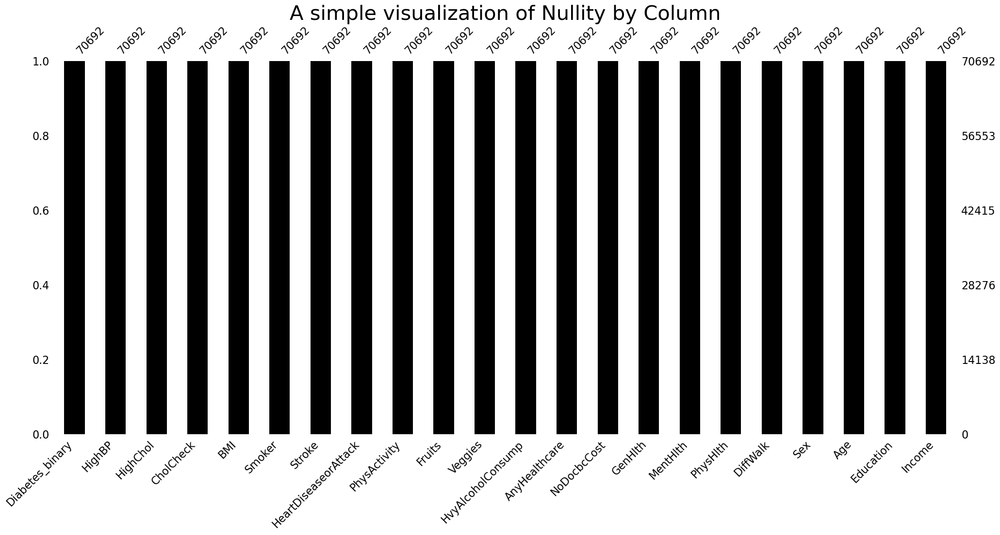

In [24]:
msno.bar(dataset_copy, color = "black")
plt.title("A simple visualization of Nullity by Column",  fontsize = 30)
plt.show()

### Does the data has Outliers? 

In [25]:
numerical_cols=['BMI','MentHlth', 'PhysHlth']

def count_outliers(data,col):
    
    q1 = data[col].quantile(0.25,interpolation='nearest')
    q2 = data[col].quantile(0.5,interpolation='nearest')
    q3 = data[col].quantile(0.75,interpolation='nearest')
    q4 = data[col].quantile(1,interpolation='nearest')

    IQR = q3 -q1
    Lower_Bound = q1 - 1.5*IQR
    Upper_Bound = q3 + 1.5*IQR

    if data[col].min() > Lower_Bound and data[col].max() < Upper_Bound:
        print("No outliers in",i)
    else:
        print("There are outliers in",i)
        x = data[data[col]<Lower_Bound][col].size
        y = data[data[col]>Upper_Bound][col].size
        a.append(i)
        print('Count of outliers are:',x+y)

a = []
for i in numerical_cols:
    count_outliers(dataset_copy,i)

There are outliers in BMI
Count of outliers are: 2181
There are outliers in MentHlth
Count of outliers are: 11816
There are outliers in PhysHlth
Count of outliers are: 10624


## Univariate Analysis 

#### Variable1

In [26]:
Diabetes_status = dataset_copy.Diabetes_binary.value_counts().reset_index(name = 'Count')
Diabetes_status

,index,Count
0,No Diabetes,35346
1,Diabetes,35346


In [27]:
fig = px.bar(Diabetes_status, x='index', y = "Count", title = "Diabetes Status", 
              labels={'index':'Diabates Classification'})
fig.show()

#### Variable2

In [28]:
Hypertension_status = dataset_copy.HighBP.value_counts().reset_index(name = 'Count')
Hypertension_status

,index,Count
0,High BP,39832
1,No High BP,30860


In [29]:
fig = px.bar(Hypertension_status, x='index', y = "Count", title = "Hypertension Status", 
              labels={'index':'Hypertension Classification'})
fig.show()

#### Variable3

In [30]:
PhysActivity = dataset_copy.PhysActivity.value_counts().reset_index(name = 'Count')
PhysActivity

,index,Count
0,Yes,49699
1,No,20993


In [31]:
fig = px.bar(PhysActivity, x='index', y = "Count", title = "Physical Activity", 
              labels={'index':'Physical Activity Distribution'})
fig.show()

#### Variable4

In [32]:
Fruits = dataset_copy.Fruits.value_counts().reset_index(name = 'Count')
Fruits

,index,Count
0,Yes,43249
1,No,27443


In [33]:
fig = px.bar(Fruits, x='index', y = "Count", title = "Fruit Intake", 
              labels={'index':'Fruits Intake Distribution'})
fig.show()

#### Variable5

In [34]:
Veggies = dataset_copy.Veggies .value_counts().reset_index(name = 'Count')
Veggies 

,index,Count
0,Yes,55760
1,No,14932


In [35]:
fig = px.bar(Veggies, x='index', y = "Count", title = "Vegetable Intake", 
              labels={'index':'Vegatable Intake Distribution'})
fig.show()

#### Variable6

In [36]:
Gender = dataset_copy.Sex.value_counts().reset_index(name = 'Count')
Gender

,index,Count
0,Female,38386
1,Male,32306


In [37]:
fig = px.bar(Gender, x='index', y = "Count", title = "Gender", 
              labels={'index':'Gender Distribution'})
fig.show()

#### Variable7

In [38]:
GenHlth = dataset_copy.GenHlth.value_counts().reset_index(name = 'Count')
GenHlth

,index,Count
0,Good,23427
1,Very Good,19872
2,Fair,13303
3,Excellent,8282
4,Poor,5808


In [39]:
fig = px.bar(GenHlth, x='index', y = "Count", title = "General Health Distribution", 
              labels={'index':'General Health Category'})
fig.show()

#### Variable8

In [40]:
Income = dataset_copy.Income.value_counts().reset_index(name = 'Count')
Income

,index,Count
0,"$75,000 or More",20646
1,"Between $50,000 and $75,000",11425
2,"Between $35,000 and $50,000",10287
3,"Between $25,000 and $35,000",8010
4,"Between $20,000 and $25,000",6658
5,"Between $15,000 and $20,000",5557
6,"Between $10,000 and $15,000",4498
7,"Less Than $10,000",3611


In [41]:
fig = px.bar(Income, x='index', y = "Count", title = "Income Distribution", 
              labels={'index':'Income Category'})
fig.show()

#### Variable9

In [42]:
Education = dataset_copy.Education.value_counts().reset_index(name = 'Count')
Education

,index,Count
0,Magister,26020
1,Undergraduate Degree,20030
2,Senior High School,19473
3,Junior High School,3447
4,Elementary,1647
5,Never Attended School,75


In [43]:
fig = px.bar(Education, x='index', y = "Count", title = "Education Distribution", 
              labels={'index':'Education Category'})
fig.show()

#### Variable10

In [44]:
HighChol = dataset_copy.HighChol.value_counts().reset_index(name = 'Count')
HighChol 

,index,Count
0,High Cholesterol,37163
1,No High Cholesterol,33529


In [45]:
fig = px.bar(HighChol, x='index', y = "Count", title = "HighCholDistribution", 
              labels={'index':'HighChol Category'})
fig.show()

#### Variable11

In [46]:
fig = px.histogram(dataset_copy, x="BMI",title = "BMI Distribution" )
fig.show()

#### Variable12

In [47]:
CholCheck = dataset_copy.CholCheck.value_counts().reset_index(name = 'Count')
CholCheck

,index,Count
0,Cholesterol Check in 5 Years,68943
1,No Cholesterol Check in 5 Years,1749


In [48]:
fig = px.bar(CholCheck, x='index', y = "Count", title = "Cholesterol Check Distribution", 
              labels={'index':'Cholesterol Check Category'})
fig.show()

#### Variable13

In [49]:
Smoker = dataset_copy.Smoker.value_counts().reset_index(name = 'Count')
Smoker 

,index,Count
0,No,37094
1,Yes,33598


In [50]:
fig = px.bar(Smoker, x='index', y = "Count", title = "Smoking Distribution", 
              labels={'index':'Smoking Category'})
fig.show()

#### Variable14

In [51]:
Age = dataset_copy.Age.value_counts().reset_index(name = 'Count')
Age

,index,Count
0,65 to 69,10856
1,60 to 64,10112
2,55 to 59,8603
3,70 to 74,8044
4,50 to 54,6872
5,80 or older,5426
6,75 to 79,5394
7,45 to 49,4648
8,40 to 44,3520
9,35 to 39,2793


In [52]:
fig = px.bar(Age, x='index', y = "Count", title = "Age Distribution", 
              labels={'index':'Age Category'})
fig.show()

#### Variable15

In [53]:
Stroke = dataset_copy.Stroke.value_counts().reset_index(name = 'Count')
Stroke 

,index,Count
0,No,66297
1,Yes,4395


In [54]:
fig = px.bar(Stroke, x='index', y = "Count", title = "Stroke Distribution", 
              labels={'index':'Stroke Category'})
fig.show()

#### Variable16

In [55]:
HvyAlcoholConsump = dataset_copy.HvyAlcoholConsump.value_counts().reset_index(name = 'Count')
HvyAlcoholConsump 

,index,Count
0,No,67672
1,Yes,3020


In [56]:
fig = px.bar(HvyAlcoholConsump, x='index', y = "Count", title = "HvyAlcoholConsump Distribution", 
              labels={'index':'HvyAlcoholConsump Category'})
fig.show()

#### Variable17

In [57]:
AnyHealthcare = dataset_copy.AnyHealthcare.value_counts().reset_index(name = 'Count')
AnyHealthcare

,index,Count
0,Yes,67508
1,No,3184


In [58]:
fig = px.bar(AnyHealthcare, x='index', y = "Count", title = "AnyHealthcare Distribution", 
              labels={'index':'AnyHealthcare Category'})
fig.show()

#### Variable18

In [59]:
NoDocbcCost = dataset_copy.NoDocbcCost.value_counts().reset_index(name = 'Count')
NoDocbcCost 

,index,Count
0,No,64053
1,Yes,6639


In [60]:
fig = px.bar(NoDocbcCost, x='index', y = "Count", title = "NoDocbcCost Distribution", 
              labels={'index':'NoDocbcCost Category'})
fig.show()

#### Variable19

In [61]:
DiffWalk = dataset_copy.DiffWalk.value_counts().reset_index(name = 'Count')
DiffWalk 

,index,Count
0,No,52826
1,Yes,17866


In [62]:
fig = px.bar(DiffWalk, x='index', y = "Count", title = "Difficulty in walking", 
              labels={'index':'Difficulty in walking Category'})
fig.show()

#### Variable20

In [63]:
HeartDiseaseorAttack = dataset_copy.HeartDiseaseorAttack.value_counts().reset_index(name = 'Count')
HeartDiseaseorAttack

,index,Count
0,No,60243
1,Yes,10449


In [64]:
fig = px.bar(HeartDiseaseorAttack, x='index', y = "Count", title = "HeartDiseaseorAttack", 
              labels={'index':'HeartDiseaseorAttack Category'})
fig.show()

#### Variable21

In [65]:
fig = px.box(dataset_copy, y="MentHlth")
fig.update_layout(yaxis_title="MentHlth (in days)")
fig.show()

#### Variable22

In [66]:
fig = px.box(dataset_copy, y="PhysHlth")
fig.update_layout(yaxis_title="PhysHlth (in days)")
fig.show()

## Bivariate Analysis

#### Variable1

In [67]:
px.histogram(dataset_copy, x=dataset_copy['BMI'], title='BMI vs. Diabetes', color='Diabetes_binary')

#### Variable2

In [68]:
diabetes_bp = dataset_copy.groupby(["Diabetes_binary", "HighBP"]).size().reset_index(name = "Count")
diabetes_bp

,Diabetes_binary,HighBP,Count
0,Diabetes,High BP,26604
1,Diabetes,No High BP,8742
2,No Diabetes,High BP,13228
3,No Diabetes,No High BP,22118


In [69]:
fig = px.bar(diabetes_bp, x="HighBP", y="Count", color="Diabetes_binary", title="Diabates-HighBP Distribution")
fig.show()

#### Variable3

In [70]:
diabetes_chol = dataset_copy.groupby(['Diabetes_binary', 'HighChol']).size().reset_index(name = 'Count')
diabetes_chol

,Diabetes_binary,HighChol,Count
0,Diabetes,High Cholesterol,23686
1,Diabetes,No High Cholesterol,11660
2,No Diabetes,High Cholesterol,13477
3,No Diabetes,No High Cholesterol,21869


In [71]:
fig = px.bar(diabetes_chol, x="HighChol", y="Count", color="Diabetes_binary", title="Diabates-HighChol Distribution")
fig.show()

#### Variable4

In [72]:
Smoker = dataset_copy.groupby(['Diabetes_binary', 'Smoker']).size().reset_index(name = 'Count')
Smoker

,Diabetes_binary,Smoker,Count
0,Diabetes,No,17029
1,Diabetes,Yes,18317
2,No Diabetes,No,20065
3,No Diabetes,Yes,15281


In [73]:
fig = px.bar(Smoker, x="Smoker", y="Count", color="Diabetes_binary", title="Diabates-Smoking Distribution")
fig.show()

#### Variable5

In [74]:
Age = dataset_copy.groupby(['Diabetes_binary', 'Age']).size().reset_index(name = 'Count')
Age

,Diabetes_binary,Age,Count
0,Diabetes,18 to 24,78
1,Diabetes,25 to 29,140
2,Diabetes,30 to 34,314
3,Diabetes,35 to 39,626
4,Diabetes,40 to 44,1051
5,Diabetes,45 to 49,1742
6,Diabetes,50 to 54,3088
7,Diabetes,55 to 59,4263
8,Diabetes,60 to 64,5733
9,Diabetes,65 to 69,6558


In [75]:
fig = px.bar(Age, x="Age", y="Count", color="Diabetes_binary", title="Diabates-Age Distribution")
fig.show()

#### Variable6

In [76]:
HeartDiseaseorAttack = dataset_copy.groupby(['Diabetes_binary', 'HeartDiseaseorAttack']).size().reset_index(name = 'Count')
HeartDiseaseorAttack

,Diabetes_binary,HeartDiseaseorAttack,Count
0,Diabetes,No,27468
1,Diabetes,Yes,7878
2,No Diabetes,No,32775
3,No Diabetes,Yes,2571


In [77]:
fig = px.bar(HeartDiseaseorAttack, x="HeartDiseaseorAttack", y="Count", color="Diabetes_binary", title="Diabates-HeartDisease/Attack Distribution")
fig.show()

#### Variable7

In [78]:
PhysActivity = dataset_copy.groupby(['Diabetes_binary', 'PhysActivity']).size().reset_index(name = 'Count')
PhysActivity

,Diabetes_binary,PhysActivity,Count
0,Diabetes,No,13059
1,Diabetes,Yes,22287
2,No Diabetes,No,7934
3,No Diabetes,Yes,27412


In [79]:
fig = px.bar(PhysActivity, x="PhysActivity", y="Count", color="Diabetes_binary", title="Diabates-PhysicalActivity Distribution")
fig.show()

#### Variable8

In [80]:
Fruits = dataset_copy.groupby(['Diabetes_binary', 'Fruits']).size().reset_index(name = 'Count')
Fruits

,Diabetes_binary,Fruits,Count
0,Diabetes,No,14653
1,Diabetes,Yes,20693
2,No Diabetes,No,12790
3,No Diabetes,Yes,22556


In [81]:
fig = px.bar(Fruits, x="Fruits", y="Count", color="Diabetes_binary", title="Diabates-Fruits Intake Distribution")
fig.show()

#### Variable9

In [82]:
Veggies = dataset_copy.groupby(['Diabetes_binary', 'Veggies']).size().reset_index(name = 'Count')
Veggies

,Diabetes_binary,Veggies,Count
0,Diabetes,No,8610
1,Diabetes,Yes,26736
2,No Diabetes,No,6322
3,No Diabetes,Yes,29024


In [83]:
fig = px.bar(Veggies, x="Veggies", y="Count", color="Diabetes_binary", title="Diabates-Veggies Intake Distribution")
fig.show()

#### Variable10

In [84]:
Gender = dataset_copy.groupby(['Diabetes_binary', 'Sex']).size().reset_index(name = 'Count')
Gender

,Diabetes_binary,Sex,Count
0,Diabetes,Female,18411
1,Diabetes,Male,16935
2,No Diabetes,Female,19975
3,No Diabetes,Male,15371


In [85]:
fig = px.bar(Gender, x="Sex", y="Count", color="Diabetes_binary", title="Diabates-Gender Distribution")
fig.show()

#### Variable11

In [86]:
GenHlth = dataset_copy.groupby(['Diabetes_binary', 'GenHlth']).size().reset_index(name = 'Count')
GenHlth

,Diabetes_binary,GenHlth,Count
0,Diabetes,Excellent,1140
1,Diabetes,Fair,9790
2,Diabetes,Good,13457
3,Diabetes,Poor,4578
4,Diabetes,Very Good,6381
5,No Diabetes,Excellent,7142
6,No Diabetes,Fair,3513
7,No Diabetes,Good,9970
8,No Diabetes,Poor,1230
9,No Diabetes,Very Good,13491


In [87]:
fig = px.bar(GenHlth, x="GenHlth", y="Count", color="Diabetes_binary", title="Diabates-GeneralHealth Distribution")
fig.show()

#### Variable12

In [88]:
CholCheck = dataset_copy.groupby(['Diabetes_binary', 'CholCheck']).size().reset_index(name = 'Count')
CholCheck

,Diabetes_binary,CholCheck,Count
0,Diabetes,Cholesterol Check in 5 Years,35105
1,Diabetes,No Cholesterol Check in 5 Years,241
2,No Diabetes,Cholesterol Check in 5 Years,33838
3,No Diabetes,No Cholesterol Check in 5 Years,1508


In [89]:
fig = px.bar(CholCheck, x="CholCheck", y="Count", color="Diabetes_binary", title="Diabates-CholCheck Distribution")
fig.show()

#### Variable13

In [90]:
Education = dataset_copy.groupby(['Diabetes_binary', 'Education']).size().reset_index(name = 'Count')
Education

,Diabetes_binary,Education,Count
0,Diabetes,Elementary,1183
1,Diabetes,Junior High School,2296
2,Diabetes,Magister,10400
3,Diabetes,Never Attended School,47
4,Diabetes,Senior High School,11066
5,Diabetes,Undergraduate Degree,10354
6,No Diabetes,Elementary,464
7,No Diabetes,Junior High School,1151
8,No Diabetes,Magister,15620
9,No Diabetes,Never Attended School,28


In [91]:
fig = px.bar(Education , x="Education", y="Count", color="Diabetes_binary", title="Diabates-Education Distribution")
fig.show()

#### Variable14

In [92]:
Income = dataset_copy.groupby(['Diabetes_binary', 'Income']).size().reset_index(name = 'Count')
Income

,Diabetes_binary,Income,Count
0,Diabetes,"$75,000 or More",7195
1,Diabetes,"Between $10,000 and $15,000",3086
2,Diabetes,"Between $15,000 and $20,000",3568
3,Diabetes,"Between $20,000 and $25,000",4054
4,Diabetes,"Between $25,000 and $35,000",4504
5,Diabetes,"Between $35,000 and $50,000",5291
6,Diabetes,"Between $50,000 and $75,000",5265
7,Diabetes,"Less Than $10,000",2383
8,No Diabetes,"$75,000 or More",13451
9,No Diabetes,"Between $10,000 and $15,000",1412


In [93]:
fig = px.bar(Income , x="Income", y="Count", color="Diabetes_binary", title="Diabates-Income Distribution")
fig.show()

#### Variable15

In [94]:
HvyAlcoholConsump = dataset_copy.groupby(['Diabetes_binary', 'HvyAlcoholConsump']).size().reset_index(name = 'Count')
HvyAlcoholConsump

,Diabetes_binary,HvyAlcoholConsump,Count
0,Diabetes,No,34514
1,Diabetes,Yes,832
2,No Diabetes,No,33158
3,No Diabetes,Yes,2188


In [95]:
fig = px.bar(HvyAlcoholConsump , x="HvyAlcoholConsump", y="Count", color="Diabetes_binary", title="Diabates-HvyAlcoholConsump Distribution")
fig.show()

#### Variable16

In [96]:
AnyHealthcare = dataset_copy.groupby(['Diabetes_binary', 'AnyHealthcare']).size().reset_index(name = 'Count')
AnyHealthcare

,Diabetes_binary,AnyHealthcare,Count
0,Diabetes,No,1422
1,Diabetes,Yes,33924
2,No Diabetes,No,1762
3,No Diabetes,Yes,33584


In [97]:
fig = px.bar(AnyHealthcare , x="AnyHealthcare", y="Count", color="Diabetes_binary", title="Diabates-AnyHealthcare Distribution")
fig.show()

#### Variable17

In [98]:
Stroke = dataset_copy.groupby(['Diabetes_binary', 'Stroke']).size().reset_index(name = 'Count')
Stroke

,Diabetes_binary,Stroke,Count
0,Diabetes,No,32078
1,Diabetes,Yes,3268
2,No Diabetes,No,34219
3,No Diabetes,Yes,1127


In [99]:
fig = px.bar(Stroke, x="Stroke", y="Count", color="Diabetes_binary", title="Diabates-StrokeDistribution")
fig.show()

#### Variable18

In [100]:
fig = px.box(dataset_copy, x="MentHlth", color="Diabetes_binary")
fig.show()

#### Variable19

In [101]:
fig = px.box(dataset_copy, x="PhysHlth", color="Diabetes_binary")
fig.show()

#### Variable20

In [102]:
DiffWalk = dataset_copy.groupby(['Diabetes_binary', 'DiffWalk']).size().reset_index(name = 'Count')
DiffWalk

,Diabetes_binary,DiffWalk,Count
0,Diabetes,No,22225
1,Diabetes,Yes,13121
2,No Diabetes,No,30601
3,No Diabetes,Yes,4745


In [103]:
fig = px.bar(DiffWalk, x="DiffWalk", y="Count", color="Diabetes_binary", title="Diabates-DiffWalk Distribution")
fig.show()

#### Variable21

In [104]:
NoDocbcCost = dataset_copy.groupby(['Diabetes_binary', 'NoDocbcCost']).size().reset_index(name = 'Count')
NoDocbcCost

,Diabetes_binary,NoDocbcCost,Count
0,Diabetes,No,31604
1,Diabetes,Yes,3742
2,No Diabetes,No,32449
3,No Diabetes,Yes,2897


In [105]:
fig = px.bar(NoDocbcCost, x="NoDocbcCost", y="Count", color="Diabetes_binary", title="Diabates-NoDocbcCost Distribution")
fig.show()

## Correlation Analysis

In [106]:
categorical_features=identify_nominal_columns(dataset_copy)

### For the Correlation Analysis we will use Dython 

Given a dataset, Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map. 

- Pearson Correlation for Numerical Data : The Pearson's correlation coefficient (r) is a measure of linear correlation between two variables. It's value lies between -1 and +1, -1 indicating total negative linear correlation, 0 indicating no linear correlation and 1 indicating total positive linear correlation. Furthermore, r is invariant under separate changes in location and scale of the two variables, implying that for a linear function the angle to the x-axis does not affect r.

- Cramer Coorelation for Categorical Data : Cramér's V is an association measure for nominal random variables. The coefficient ranges from 0 to 1, with 0 indicating independence and 1 indicating perfect association. The empirical estimators used for Cramér's V have been proved to be biased, even for large samples. In practice, you may find that a Cramer's V of .10 provides a good minimum threshold for suggesting there is a substantive relationship between two variables.

Reference 
- https://blog.knoldus.com/how-to-find-correlation-value-of-categorical-variables/
- http://shakedzy.xyz/dython/modules/nominal/#cramers_v
- https://www.acastat.com/statbook/chisqassoc.htm#:~:text=between%20the%20variables.-,It%20is%20interpreted%20as%20a%20measure%20of%20the%20relative%20(strength,substantive%20relationship%20between%20two%20variables.

### Correlation of the Complete Dataset

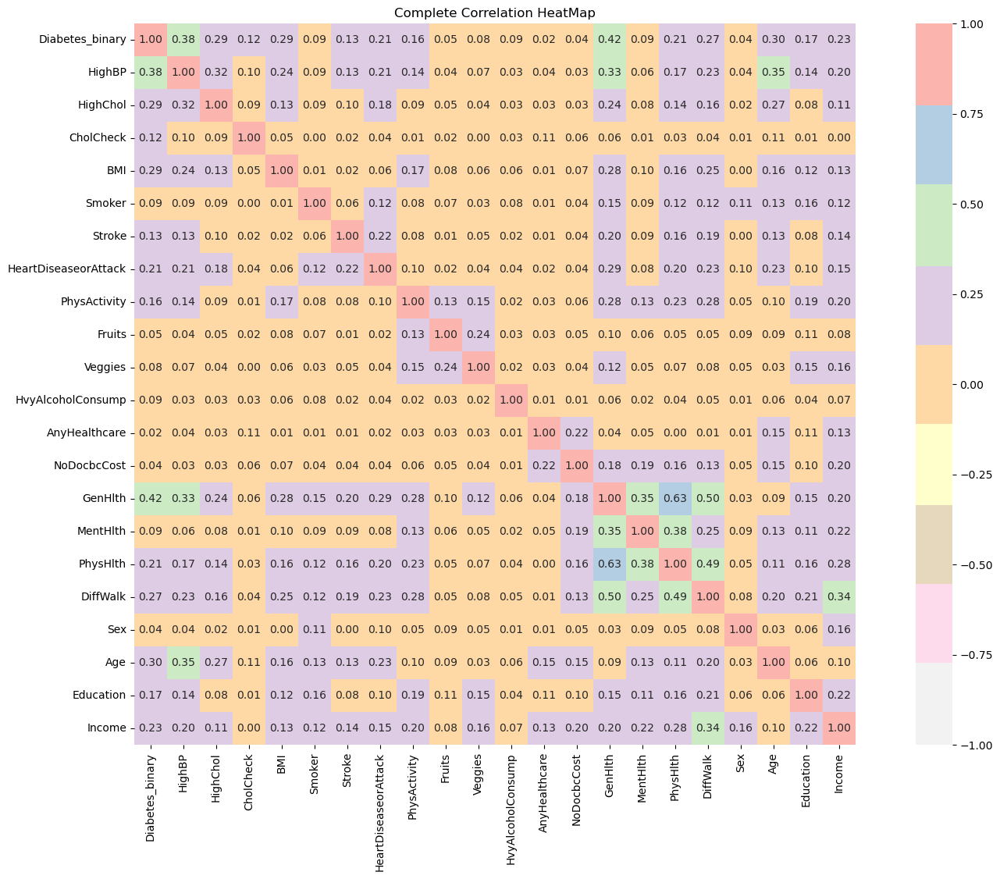

In [107]:
fig, ax = plt.subplots(figsize=(20,12))
comp_correlation = associations(dataset_copy, ax = ax, vmin = -1, vmax=1.0,
                               cmap = 'Pastel1_r', title = 'Complete Correlation HeatMap')
plt.show()

### Correlation of the Categorical Variables 

In [108]:
selected_column= dataset_copy[categorical_features]
categorical_df = selected_column.copy()

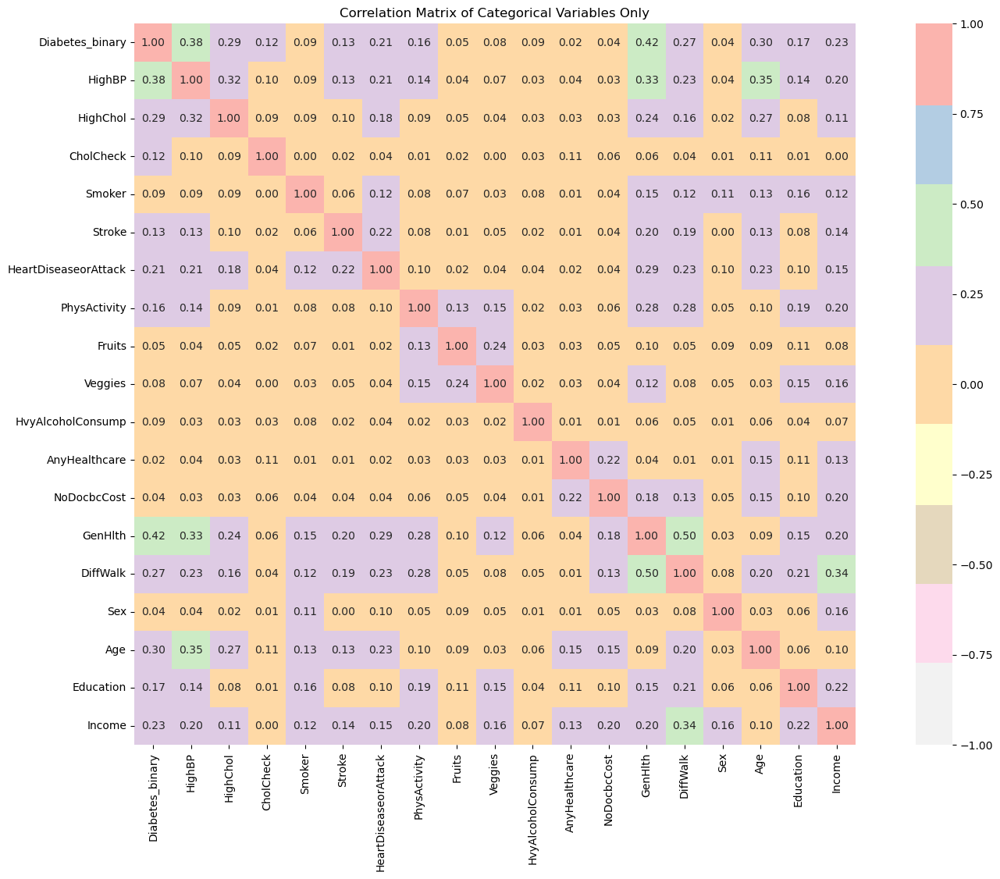

In [109]:
fig, ax = plt.subplots(figsize=(20,12))
categorical_correlation=  associations(categorical_df, nom_nom_assoc = 'cramer', ax = ax, vmin = -1, vmax=1.0,
                               cmap = 'Pastel1_r', title = 'Correlation Matrix of Categorical Variables Only')
plt.show()

### Correlation of the Numerical Variables 

In [110]:
from dython.nominal import identify_numeric_columns
num_col = identify_numeric_columns(dataset_copy)

In [111]:
selected_num_col= dataset_copy[num_col]
selected_num_col_df = selected_num_col.copy()

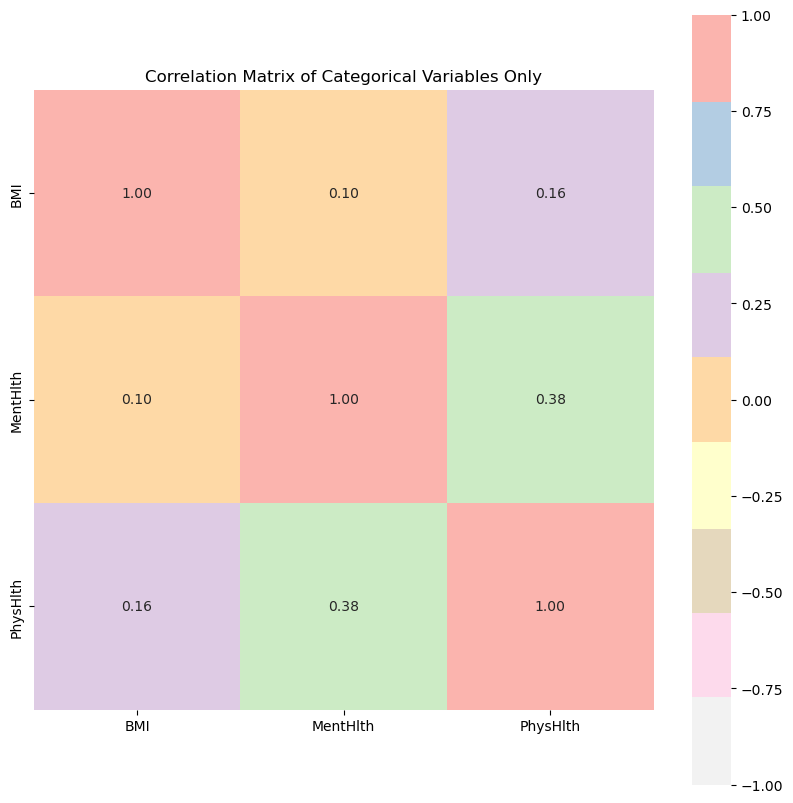

In [112]:
fig, ax = plt.subplots(figsize=(10,10))
numerical_correlation= associations(selected_num_col_df,nom_nom_assoc = 'pearson', ax = ax, vmin = -1, vmax=1.0,
                               cmap = 'Pastel1_r', title = 'Correlation Matrix of Categorical Variables Only')
plt.show()

## Modelling 

### Feature Selection 

Random forest feature importance : Random forests are among the most popular machine learning methods thanks to their relatively good accuracy, robustness and ease of use. They also provide two straightforward methods for feature selection: mean decrease impurity and mean decrease accuracy.


Feature selection : try selecting different set of features and check the effect on accuracy
2.Hyperparameter tuning : try using grid search, tweaking number of trees or max nodes and check the effect on accuracy
3.Try different model : You can try a XGB model or even a SVM to check how well they perform against the random forest

In [113]:
dataset.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [114]:
X = dataset.drop('Diabetes_binary', axis = 1)
y = dataset['Diabetes_binary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [115]:
rf = RandomForestClassifier(random_state = 1, max_features = 'sqrt', n_jobs = 1, verbose = 1)
%time rf.fit(X_train, y_train)
rf.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


CPU times: user 3.57 s, sys: 156 ms, total: 3.73 s
Wall time: 3.47 s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


0.740168618797035

In [116]:
#prediction
y_pred = rf.predict(X_test)
print(y_pred)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[1. 0. 0. ... 1. 0. 1.]


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


In [117]:
#check MSE & RMSE 
mse = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))
#confusion matrix
matrix = metrics.confusion_matrix(y_test, y_pred)
print(matrix)
#classification report
report = metrics.classification_report(y_test, y_pred)
print(report)

Mean Squared Error : 0.25983138120296495
Root Mean Squared Error : 0.5097365802088025
[[6100 2589]
 [2003 6981]]
              precision    recall  f1-score   support

         0.0       0.75      0.70      0.73      8689
         1.0       0.73      0.78      0.75      8984

    accuracy                           0.74     17673
   macro avg       0.74      0.74      0.74     17673
weighted avg       0.74      0.74      0.74     17673



In [118]:
#defining of feature
feature = pd.Series(rf.feature_importances_, index = X_train.columns).sort_values(ascending = False)

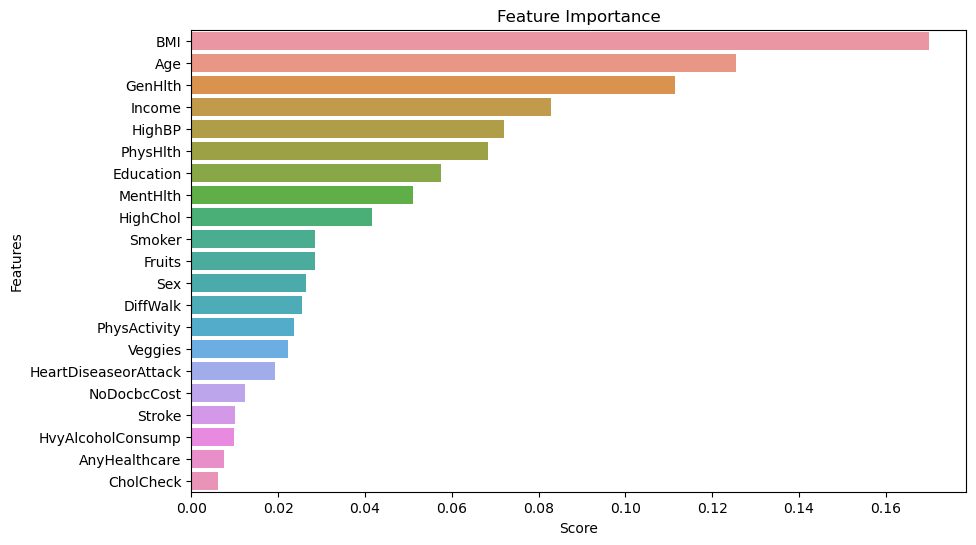

In [119]:
#visualize feature
plt.figure(figsize = (10,6))
sns.barplot(x = feature, y = feature.index)
plt.title("Feature Importance")
plt.xlabel('Score')
plt.ylabel('Features')
plt.show()

In [120]:
my_features=list(feature[feature>0.05].index)
my_features

['BMI',
 'Age',
 'GenHlth',
 'Income',
 'HighBP',
 'PhysHlth',
 'Education',
 'MentHlth']

### Feature Selection Through Chi2

Chi-Square is to be used when the feature is categorical, the target variable is any way can be thought as categorical. It measures the degree of association between two categorical variables.

In [121]:
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2 , f_classif

In [122]:
dataset.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [123]:
x_orig = dataset.drop(['Diabetes_binary'], axis=1)
y_orig = dataset['Diabetes_binary']

In [124]:
FeatureSelection = SelectPercentile(score_func = chi2, percentile=70) 
x = FeatureSelection.fit_transform(x_orig, y_orig)

#showing X Dimension 
print('X Shape is ' , x.shape)
print('Selected Features are : ' , FeatureSelection.get_support())

X Shape is  (70692, 14)
Selected Features are :  [ True  True False  True False  True  True  True False False  True False
 False  True  True  True  True False  True  True  True]


In [125]:
fe=FeatureSelection.get_support()
selected_features=[]
for i in range(len(fe)):
    if fe[i]==True:
        selected_features.append(dataset.columns[i])
        
selected_features.remove('Diabetes_binary')
selected_features

['HighBP',
 'CholCheck',
 'Smoker',
 'Stroke',
 'HeartDiseaseorAttack',
 'Veggies',
 'NoDocbcCost',
 'GenHlth',
 'MentHlth',
 'PhysHlth',
 'Sex',
 'Age',
 'Education']

### Predictive Modelling 

In [126]:
data_selected = dataset.loc[:,['Diabetes_binary', 'HighBP', 'BMI','PhysHlth', 'GenHlth','MentHlth',
                               'Age', 'Education', 'Income', 'Smoker', 'Sex']]

In [127]:
df_train, df_test = train_test_split(data_selected, test_size=0.25, random_state=0)
df_train, df_val = train_test_split(data_selected, test_size=0.25, random_state=0)

x,y = df_train.drop(['Diabetes_binary'],axis=1),df_train['Diabetes_binary']

In [128]:
x_train1,y_train = df_train.drop(['Diabetes_binary'],axis=1),df_train['Diabetes_binary']
x_val1,y_val = df_val.drop(['Diabetes_binary'],axis=1),df_val['Diabetes_binary']
x_test1,y_test= df_test.drop(['Diabetes_binary'],axis=1),df_test['Diabetes_binary']

#### Feature Scaling 

Standardizing a dataset involves rescaling the distribution of values so that the mean of observed values is 0 and the standard deviation is 1.This can be thought of as subtracting the mean value or centering the data. Scaling the features is of utmost importance because different features are in different scales. Best practice is to use only the training set to figure out how to scale / normalize, then blindly apply the same transform to the test set.

In [129]:
scaler = MinMaxScaler()
scaler.fit(x_train1)

x_train = scaler.transform(x_train1)
x_test= scaler.transform(x_test1)
x_val=scaler.transform(x_val1)

In [130]:
# create a dict to store the scores of each model
models_evalutions = {'Model':[],
                     'Accuracy':[],
                     'Precision':[],
                     'Recall':[], 
                     'F1 score':[]}

### Model 1 K-nearest Neighbors Classification with Cross Validation

In [131]:
kf = KFold(n_splits=5, random_state=42, shuffle=True)

In [132]:
knn = KNeighborsClassifier(n_neighbors=5)
accuracy_score1=[]
f1_score1 = []
percision_score1 = []
recall_score1 = []


for train_ix, test_ix in kf.split(x, y):
    train_x, test_X = x.iloc[train_ix], x.iloc[test_ix]
    train_y, test_y = y.iloc[train_ix], y.iloc[test_ix]
    knn.fit(train_x, train_y)
    y_pred =knn.predict(test_X)
    accuracy_score1.append(metrics.accuracy_score(test_y, y_pred))
    percision_score1.append(metrics.precision_score(test_y, y_pred))
    recall_score1.append(metrics.recall_score(test_y, y_pred))
    f1_score1.append(metrics.f1_score(test_y, y_pred))


    
print("kNN accuracy score: \t")
print(sum(accuracy_score1) / len(accuracy_score1))
print("----------------")    
print("kNN score: \t")
print(sum(f1_score1) / len(f1_score1))
print("----------------")
conf_mat3 = confusion_matrix(test_y, y_pred)
print("kNN confusion matrix: \n",conf_mat3)
print("----------------")
print("KNN precision score")
print(sum(percision_score1) / len(percision_score1))
print("----------------")
print("KNN recall_score")
print(sum(recall_score1) / len(recall_score1))
print("----------------")

kNN accuracy score: 	
0.6992022392614803
----------------
kNN score: 	
0.704982391593277
----------------
kNN confusion matrix: 
 [[3654 1723]
 [1429 3797]]
----------------
KNN precision score
0.6880075930304321
----------------
KNN recall_score
0.722835403920078
----------------


In [133]:
models_evalutions['Model'].append("K Nearest Neighbours")
models_evalutions['Accuracy'].append(accuracy_score(test_y, y_pred))
models_evalutions['Precision'].append(precision_score(test_y, y_pred))
models_evalutions['Recall'].append(recall_score(test_y, y_pred))
models_evalutions['F1 score'].append(f1_score(test_y, y_pred))

In [134]:
knn_final = knn.n_neighbors

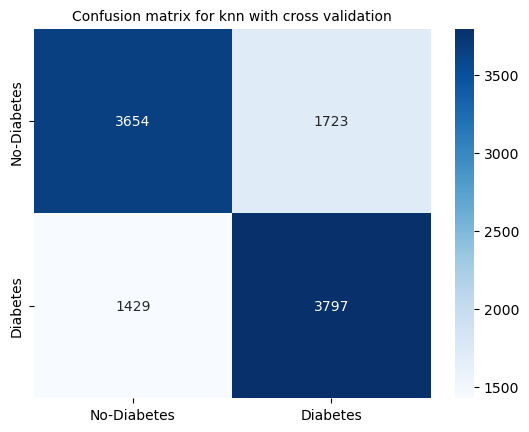

In [135]:
cm =confusion_matrix(test_y, y_pred)
class_label = ["No-Diabetes", "Diabetes"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d", cmap='Blues')
plt.title('Confusion matrix for knn with cross validation', fontsize = 10);

### Model 2 Decision Tree Classification

In [136]:
x3_train=x_train.copy()
x3_val=x_val.copy()

In [137]:
# finding the best parameters for the decision tree
param_grid = {'criterion' :['gini', 'entropy'],'max_depth': [4, 6, 10, 12]}

tree_clas = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True, scoring = 'f1')
grid_search.fit(x3_train, y_train)

dtfinal = print(grid_search.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=42)


In [138]:
# trying with entropy, since it didn't show in the previose step
tree = DecisionTreeClassifier(criterion='entropy',
                                     max_depth=6,
                                     max_features='auto',
                                     random_state=42)

tree.fit(x3_train,y_train)

print("Training Score In Decision Tree Classification:",tree.score(x3_train, y_train))
print("Validation Score In Decision Tree: Classification",tree.score(x3_val, y_val))
y_pred = tree.predict(x3_val)

print("DT Accuracy=",accuracy_score(y_val, y_pred))
print("DT F1 score=",f1_score(y_val, y_pred))

Training Score In Decision Tree Classification: 0.7268903600596013
Validation Score In Decision Tree: Classification 0.7257964126068014
DT Accuracy= 0.7257964126068014
DT F1 score= 0.7426993734735055


In [139]:
# classification report for Decision Tree 
print(classification_report(y_val, y_pred, digits=3, zero_division = 1))
acc_nb = accuracy_score(y_val, y_pred)
recall_nb = recall_score(y_val, y_pred, average="binary")
print("ACCURACY:",accuracy_score(y_val, y_pred))
print("RECALL:",recall_score(y_val, y_pred, average="binary"))

              precision    recall  f1-score   support

         0.0      0.746     0.671     0.707      8689
         1.0      0.710     0.778     0.743      8984

    accuracy                          0.726     17673
   macro avg      0.728     0.725     0.725     17673
weighted avg      0.728     0.726     0.725     17673

ACCURACY: 0.7257964126068014
RECALL: 0.7784951024042742


In [140]:
models_evalutions['Model'].append("Decision Tree Classification")
models_evalutions['Accuracy'].append(accuracy_score(y_val, y_pred))
models_evalutions['Precision'].append(precision_score(y_val, y_pred))
models_evalutions['Recall'].append(recall_score(y_val, y_pred))
models_evalutions['F1 score'].append(f1_score(y_val, y_pred))

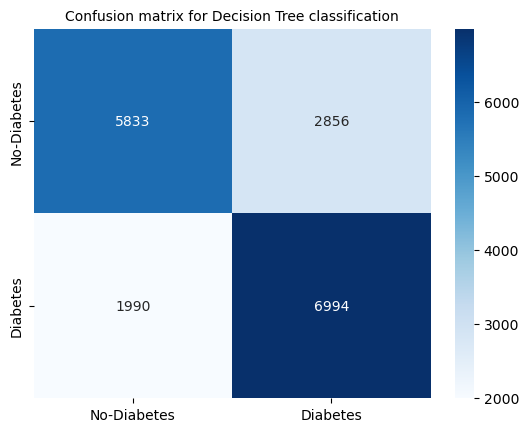

In [141]:
# plotting confusion mtrix
cm = confusion_matrix(y_val, y_pred)
class_label = ["No-Diabetes", "Diabetes"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d", cmap='Blues')
plt.title('Confusion matrix for Decision Tree classification', fontsize = 10);

### Model 3 Random Forest Classification 

In [142]:
x5_train=x_train.copy()
x5_val=x_val.copy()

In [143]:
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [4, 6, 10, 12],
    'random_state': [13]
}

In [144]:
kf = KFold(n_splits=5, shuffle=False)
example_params = {
        'n_estimators': 50,
        'max_depth':4 ,
        'random_state': 13
    }

In [145]:
imba_pipeline = make_pipeline(SMOTE(random_state=42),RandomForestClassifier(n_estimators=5, random_state=13))
cross_val_score(imba_pipeline, x5_train, y_train, scoring='f1', cv=kf)

array([0.69933477, 0.69609952, 0.69240862, 0.69637574, 0.68773585])

In [146]:
new_params = {'randomforestclassifier__' + key: params[key] for key in params}
grid_imba = GridSearchCV(imba_pipeline, param_grid=new_params, cv=kf, scoring='f1',return_train_score=True)
grid_imba.fit(x5_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('smote', SMOTE(random_state=42)),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(n_estimators=5,
                                                               random_state=13))]),
             param_grid={'randomforestclassifier__max_depth': [4, 6, 10, 12],
                         'randomforestclassifier__n_estimators': [50, 100, 200],
                         'randomforestclassifier__random_state': [13]},
             return_train_score=True, scoring='f1')

In [147]:
print("Training Score In Random Forest Classification:",grid_imba.score(x5_train, y_train))
print("Validation Score In Random Forest Classification:",grid_imba.score(x5_val, y_val))

Training Score In Random Forest Classification: 0.7793396653098145
Validation Score In Random Forest Classification: 0.7610193941336753


In [148]:
rf_best=grid_imba.best_params_
rf_best

{'randomforestclassifier__max_depth': 10,
 'randomforestclassifier__n_estimators': 100,
 'randomforestclassifier__random_state': 13}

In [149]:
# Random Forest with best hyperparameter
rf_best = RandomForestClassifier(n_estimators=100,
                                 max_depth=10,
                                 random_state=13)
rf_best.fit(x5_train, y_train)
y_pred = rf_best.predict(x5_val)

In [150]:

print("Training Score In Random Forest Classification with best parameters:",rf_best.score(x5_train, y_train))
print("Validation Score In Random Forest Classification:with best parameters",rf_best.score(x5_val, y_val))

Training Score In Random Forest Classification with best parameters: 0.7701955902600954
Validation Score In Random Forest Classification:with best parameters 0.7456006337350761


In [151]:
# classification report for Random forest 
print(classification_report(y_val, y_pred, digits=3, zero_division = 1))
acc_nb = accuracy_score(y_val, y_pred)
recall_nb = recall_score(y_val, y_pred, average="binary")
print("ACCURACY:",accuracy_score(y_val, y_pred))
print("RECALL:",recall_score(y_val, y_pred, average="binary"))

              precision    recall  f1-score   support

         0.0      0.764     0.698     0.730      8689
         1.0      0.731     0.791     0.760      8984

    accuracy                          0.746     17673
   macro avg      0.747     0.745     0.745     17673
weighted avg      0.747     0.746     0.745     17673

ACCURACY: 0.7456006337350761
RECALL: 0.7914069456812111


In [152]:
models_evalutions['Model'].append("RandomForestClassifier")
models_evalutions['Accuracy'].append(accuracy_score(y_val, y_pred))
models_evalutions['Precision'].append(precision_score(y_val, y_pred))
models_evalutions['Recall'].append(recall_score(y_val, y_pred))
models_evalutions['F1 score'].append(f1_score(y_val, y_pred))

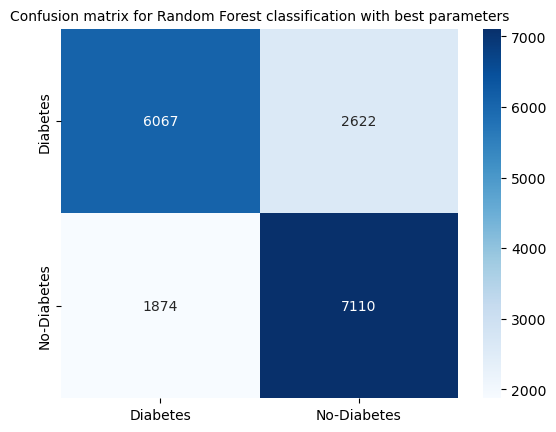

In [153]:
# plotting confusion mtrix
cm = confusion_matrix(y_val, y_pred)
class_label = ["Diabetes", "No-Diabetes"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d", cmap='Blues');
plt.title('Confusion matrix for Random Forest classification with best parameters', fontsize = 10); 

In [154]:
result= pd.DataFrame.from_dict(models_evalutions)
result

,Model,Accuracy,Precision,Recall,F1 score
0,K Nearest Neighbours,0.702726,0.687862,0.726560,0.706682
1,Decision Tree Classification,0.725796,0.710051,0.778495,0.742699
2,RandomForestClassifier,0.745601,0.730580,0.791407,0.759778


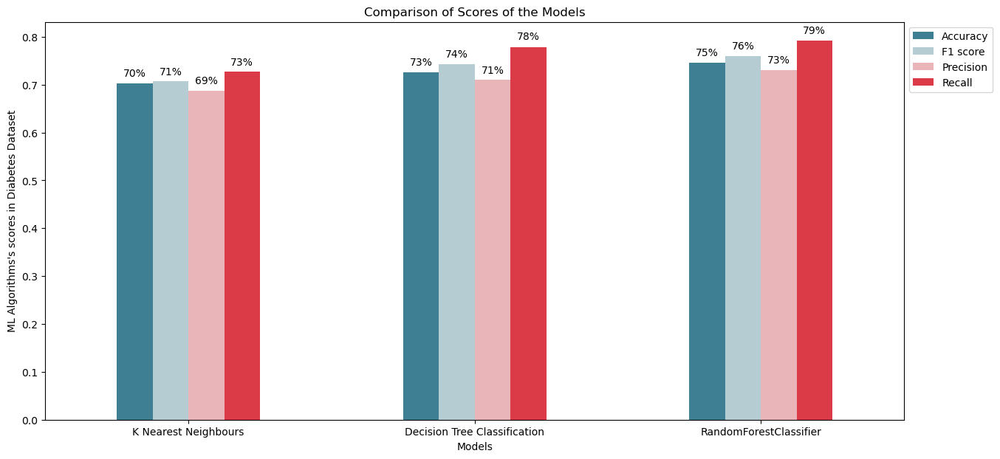

In [155]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ax = result.plot.bar(x='Model',y=['Accuracy','F1 score','Precision','Recall'], cmap=cmap, figsize=(15,7))
plt.title("Comparison of Scores of the Models")
plt.ylabel("ML Algorithms's scores in Diabetes Dataset")
plt.xlabel("Models")
plt.xticks(rotation =360)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{height:.0%}', (x + width/2, y + height*1.02), ha='center')
plt.show()

### Developing Diabetes Risk Calculator Using Random Forest Classifier

In [156]:
X = data_selected.drop('Diabetes_binary', axis = 1)
X = X.values
y = data_selected['Diabetes_binary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [157]:
rf = RandomForestClassifier(n_estimators=100,max_depth=10,random_state=13)
%time rf.fit(X_train, y_train)
rf.score(X_test, y_test)

CPU times: user 1.87 s, sys: 5.91 ms, total: 1.87 s
Wall time: 1.87 s


0.745657217224014

In [158]:
#prediction
y_pred = rf.predict(X_test)
print(y_pred)

[1. 0. 0. ... 1. 0. 1.]


In [159]:
#check MSE & RMSE 
mse = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))
#confusion matrix
matrix = metrics.confusion_matrix(y_test, y_pred)
print(matrix)
#classification report
report = metrics.classification_report(y_test, y_pred)
print(report)

Mean Squared Error : 0.254342782775986
Root Mean Squared Error : 0.5043240850643423
[[6067 2622]
 [1873 7111]]
              precision    recall  f1-score   support

         0.0       0.76      0.70      0.73      8689
         1.0       0.73      0.79      0.76      8984

    accuracy                           0.75     17673
   macro avg       0.75      0.74      0.74     17673
weighted avg       0.75      0.75      0.75     17673



In [160]:
import pickle

In [161]:
# Save the trained model as a pickle string.
saved_model = pickle.dumps(rf)

# Load the pickled model
rf_from_pickle = pickle.loads(saved_model)

# Use the loaded pickled model to make predictions
rf_from_pickle.predict(X_test)

array([1., 0., 0., ..., 1., 0., 1.])

In [162]:
y_test.value_counts()

1.0    8984
0.0    8689
Name: Diabetes_binary, dtype: int64

In [163]:
newdata = [[0.0,23.0,3.0,1.0,14.0,3.0,6.0,8.0,0.0,0.0]]

In [164]:
rf.predict(newdata)

array([0.])

In [165]:
data_selected.head()

,Diabetes_binary,HighBP,BMI,PhysHlth,GenHlth,MentHlth,Age,Education,Income,Smoker,Sex
0,0.0,1.0,26.0,30.0,3.0,5.0,4.0,6.0,8.0,0.0,1.0
1,0.0,1.0,26.0,0.0,3.0,0.0,12.0,6.0,8.0,1.0,1.0
2,0.0,0.0,26.0,10.0,1.0,0.0,13.0,6.0,8.0,0.0,1.0
3,0.0,1.0,28.0,3.0,3.0,0.0,11.0,6.0,8.0,1.0,1.0
4,0.0,0.0,29.0,0.0,2.0,0.0,8.0,5.0,8.0,1.0,0.0


In [166]:
rf.predict([[0.0,29.0,0.0,2.0,0.0,8.0,5.0,8.0,1.0,0.0]]) #4th value

array([0.])

In [167]:
rf.predict([[0.0,26.0,10.0,1.0,0.0,13.0,6.0,8.0,0.0,1.0]]) #2nd value 

array([0.])

In [168]:
data_selected.tail()

,Diabetes_binary,HighBP,BMI,PhysHlth,GenHlth,MentHlth,Age,Education,Income,Smoker,Sex
70687,1.0,0.0,37.0,0.0,4.0,0.0,6.0,4.0,1.0,0.0,0.0
70688,1.0,0.0,29.0,0.0,2.0,0.0,10.0,3.0,6.0,1.0,1.0
70689,1.0,1.0,25.0,0.0,5.0,15.0,13.0,6.0,4.0,0.0,0.0
70690,1.0,1.0,18.0,0.0,4.0,0.0,11.0,2.0,4.0,0.0,0.0
70691,1.0,1.0,25.0,0.0,2.0,0.0,9.0,6.0,2.0,0.0,0.0


In [169]:
rf.predict([[1.0,18.0,0.0,4.0,0.0,11.0,2.0,4.0,0.0,0.0]]) #70690 value

array([1.])

In [170]:
rf.predict([[0.0,37.0,0.0,4.0,0.0,6.0,4.0,1.0,0.0,0.0]]) #70687 value

array([1.])

### Risk Predictor 

In [171]:
rf.predict_proba(X_test)

array([[0.29882164, 0.70117836],
       [0.88547423, 0.11452577],
       [0.7888538 , 0.2111462 ],
       ...,
       [0.48294737, 0.51705263],
       [0.77847678, 0.22152322],
       [0.24660453, 0.75339547]])

In [172]:
y_test.value_counts()

1.0    8984
0.0    8689
Name: Diabetes_binary, dtype: int64

In [173]:
def diabetes_risk_prediction(HighBP, BMI, PhysHlth, GenHlth, MentHlth,
                            Age, Education , Income, Smoker, Sex):
    indicator_list = [HighBP, BMI,PhysHlth, GenHlth, MentHlth,Age, Education, Income, Smoker, Sex]
    predictions = rf.predict_proba(np.array(indicator_list).reshape(1, -1))
    risk = predictions[0,1]
    print("-"*len("Health Indicator Analysis"))
    print("Health Indicator Analysis")
    print("-"*len("Health Indicator Analysis"))   
    if risk < 0.3:
        print("You are probably in good health, keep it up.")

        #print("-"*len("You are probably in good health, keep it up"))
    elif risk > 0.7:
        print("See a doctor as soon as you can and listen to their recommendations. You might be on the way to developing diabetes if you don't change your lifestyle.")
        
    elif risk > 0.9:
        print("Go to a hospital right away. Odds are high you have diabetes.")
    else:
        print("You should be alright for the most part, but take care not to let your health slip.")
    return print("Your Diabetes Risk Index is {:.2f}/50.".format(risk*0.5*100))

In [174]:
diabetes_risk_prediction(0,37,0,4,0,6,4,1,0,0)

-------------------------
Health Indicator Analysis
-------------------------
You should be alright for the most part, but take care not to let your health slip.
Your Diabetes Risk Index is 31.48/50.


In [175]:
while True:
    try:
        while True:
            HighBP = float(input("Do you have High Blood Pressure (0 = no high BP, 1 = high BP?):\n"))
            if HighBP < 2:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue

while True:
    try:
        while True:
            BMI = float(input("Enter your Body Mass Index (kg/m2):\n"))
            if BMI > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        
while True:
    try:
        while True:
            PhysHlth = float(input("Physical illness or injury days in past 30 days (scale 1-30)?:\n"))
            if PhysHlth > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        
while True:
    try:
        while True:
            GenHlth = float(input("Would you say that in general your health is: 1 = excellent, 2 = very good, 3 = good, 4 = fair, 5 = poor):\n"))
            if GenHlth > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue

while True:
    try:
        while True:
            MentHlth = float(input("Days of poor mental health scale 1-30 days:\n"))
            if MentHlth > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        
while True:
    try:
        while True:
            Age = float(input("Enter your Age category : 1 = 18-24, 2 = 25-29, 3 = 30-34, 4 = 35-39, 5 = 40-44, 6 = 45-49, 7 = 50-54, 8 = 55-59, 9 = 60-64, 10 = 65-69, 11 = 70-74, 12 = 75-79, 13 = 80+:\n"))
            if Age > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
         
while True:
    try:
        while True:
            Education = float(input("Enter Education level on the scale 1-6 : 1 = Never attended school or only kindergarten, 2 = elementary, 3 = Junior High School , 4 = Senior High School, 5 = Undergraduate Degree , 6 = Magister:\n"))
            if Education > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        
while True:
    try:
        while True:
            Income = float(input("Income scale scale 1-8 1 = less than $10,000, 2 = Between $10,000 and $15,000, 3 = Between $15,000 and $20,000, 4 = Between $20,000 and $25,000, 5 = Between $25,000 and $35,000 , 6 = Between $35,000 and $50,000, 7 = Between $50,000 and $75,000, 8 = $75,000 or more :\n"))
            if Income > 0:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue    
         
while True:
    try:
        while True:
            Smoker = float(input("Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes] 0 = no 1 = yes :\n"))
            if Smoker < 2:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        
while True:
    try:
        while True:
            Sex = float(input("What is your gender? 0 = female 1 = male :\n"))
            if Sex < 2:
                    break
            else:
                print("Please enter a valid value")
        break
    except (ValueError, NameError):# if the input is invalid 
        print("Invalid input! Please choose again.") #prompts user to input valid action
        continue
        

        
diabetes_risk_prediction(HighBP, BMI, PhysHlth, GenHlth, MentHlth,Age, Education , Income, Smoker, Sex)

Do you have High Blood Pressure (0 = no high BP, 1 = high BP?):
1
Enter your Body Mass Index (kg/m2):
40
Physical illness or injury days in past 30 days (scale 1-30)?:
5
Would you say that in general your health is: 1 = excellent, 2 = very good, 3 = good, 4 = fair, 5 = poor):
4
Days of poor mental health scale 1-30 days:
6
Enter your Age category : 1 = 18-24, 2 = 25-29, 3 = 30-34, 4 = 35-39, 5 = 40-44, 6 = 45-49, 7 = 50-54, 8 = 55-59, 9 = 60-64, 10 = 65-69, 11 = 70-74, 12 = 75-79, 13 = 80+:
4
Enter Education level on the scale 1-6 : 1 = Never attended school or only kindergarten, 2 = elementary, 3 = Junior High School , 4 = Senior High School, 5 = Undergraduate Degree , 6 = Magister:
4
Income scale scale 1-8 1 = less than $10,000, 2 = Between $10,000 and $15,000, 3 = Between $15,000 and $20,000, 4 = Between $20,000 and $25,000, 5 = Between $25,000 and $35,000 , 6 = Between $35,000 and $50,000, 7 = Between $50,000 and $75,000, 8 = $75,000 or more :
5
Have you smoked at least 100 cigaret